In [ ]:
%uv pip install paddleocr vietocr paddlepaddle pillow==6.2.2
#%pip install torch==1.10.0+cu113 torchvision==0.11.1+cu113 torchaudio==0.10.0+cu113 -f https://download.pytorch.org/whl/cu113/torch_stable.html -q

Using Python 3.10.16 environment at: /Users/nhuantran/Working/learn/omni_note_app/venv


OSError: [Errno 5] Input/output error

In [1]:
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import torch
from paddleocr import PaddleOCR

from vietocr.tool.predictor import Predictor
from vietocr.tool.config import Cfg

from paddleocr import PaddleOCR, draw_ocr

# Paddle + VietOCR

In [2]:
config = Cfg.load_config_from_name('vgg_seq2seq')

In [3]:
#config['weights'] = './weights/transformerocr.pth'
#config['cnn']['pretrained']=False

config['weights'] = 'https://vocr.vn/data/vietocr/vgg_seq2seq.pth'
config['pretrain'] = 'https://vocr.vn/data/vietocr/vgg_seq2seq.pth'
config["device"] = "cuda" if torch.cuda.is_available() else "cpu"

detector = Predictor(config)

Model weight /var/folders/_q/zxnjn9rd7vj0h6477qfvbfw00000gn/T/vgg_seq2seq.pth exsits. Ignore download!


In [4]:
config

{'vocab': 'aAàÀảẢãÃáÁạẠăĂằẰẳẲẵẴắẮặẶâÂầẦẩẨẫẪấẤậẬbBcCdDđĐeEèÈẻẺẽẼéÉẹẸêÊềỀểỂễỄếẾệỆfFgGhHiIìÌỉỈĩĨíÍịỊjJkKlLmMnNoOòÒỏỎõÕóÓọỌôÔồỒổỔỗỖốỐộỘơƠờỜởỞỡỠớỚợỢpPqQrRsStTuUùÙủỦũŨúÚụỤưƯừỪửỬữỮứỨựỰvVwWxXyYỳỲỷỶỹỸýÝỵỴzZ0123456789!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~ ',
 'device': 'cpu',
 'seq_modeling': 'seq2seq',
 'transformer': {'encoder_hidden': 256,
  'decoder_hidden': 256,
  'img_channel': 256,
  'decoder_embedded': 256,
  'dropout': 0.1},
 'optimizer': {'max_lr': 0.001, 'pct_start': 0.1},
 'trainer': {'batch_size': 32,
  'print_every': 200,
  'valid_every': 4000,
  'iters': 100000,
  'export': './weights/transformerocr.pth',
  'checkpoint': './checkpoint/transformerocr_checkpoint.pth',
  'log': './train.log',
  'metrics': None},
 'dataset': {'name': 'data',
  'data_root': './img/',
  'train_annotation': 'annotation_train.txt',
  'valid_annotation': 'annotation_val_small.txt',
  'image_height': 32,
  'image_min_width': 32,
  'image_max_width': 512},
 'dataloader': {'num_workers': 3, 'pin_memory': True},
 

In [5]:
def display_image_in_actual_size(im_data, dpi=600):
    #im_data = plt.imread(im_path)
    height, width, depth = im_data.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

In [6]:
img_path = '/Users/nhuantran/Downloads/IMG_0969.jpeg'
img = cv2.imread(img_path)
#img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)

use_gpu = True if torch.cuda.is_available() else False
paddle = PaddleOCR(use_angle_cls=False, lang="vi", use_gpu=use_gpu, ocr_version="PP-OCRv4")
result = paddle.ocr(img_path, cls=False, det=True, rec=True)#, rec=False)
result = result[:][:][0]

[2025/03/07 14:19:46] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/Users/nhuantran/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/Users/nhuantran/.paddleocr/whl/rec/latin/latin_PP-OCRv3_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=

001000001000
Xem menu và đặt giao hàng
Cheers my soymatel
1.612.600d
Còn phải thu
1.612.600d
Tổng thanh toán
146.6000
THUẾ GTGT (10%)
1.466.0000
Tiền hàng
135.000
135.000
1
IIE Flottante
9
Bò
175.000
175.000
1
8
Gyudon - Cơm
Truffle
355.000
1
355.000
7
Tagliolino Miso
Nướng Tái
97.500
195.000
0,5
Cuộn Cá Hồi
6
Salmon Roll
Lươn Đại
147.500
295.000
0,5
Roll - Cuộn
5
Jumbo Unagi
Tempura
168.000
168.000
1
Soft Shell Crab
188.000
188.000
Sake Sashimi
3
100.000
100.000
Hi - Tea
100.000
100.000
Dâu Hứa
TT
ĐG
SL
Tên món
Phục vực Tràn Anh va
S1 KHƯỚC 4
Bản na
PHIẾU TẠM TÍNH
18A HÀ HÀI
Umamibarn


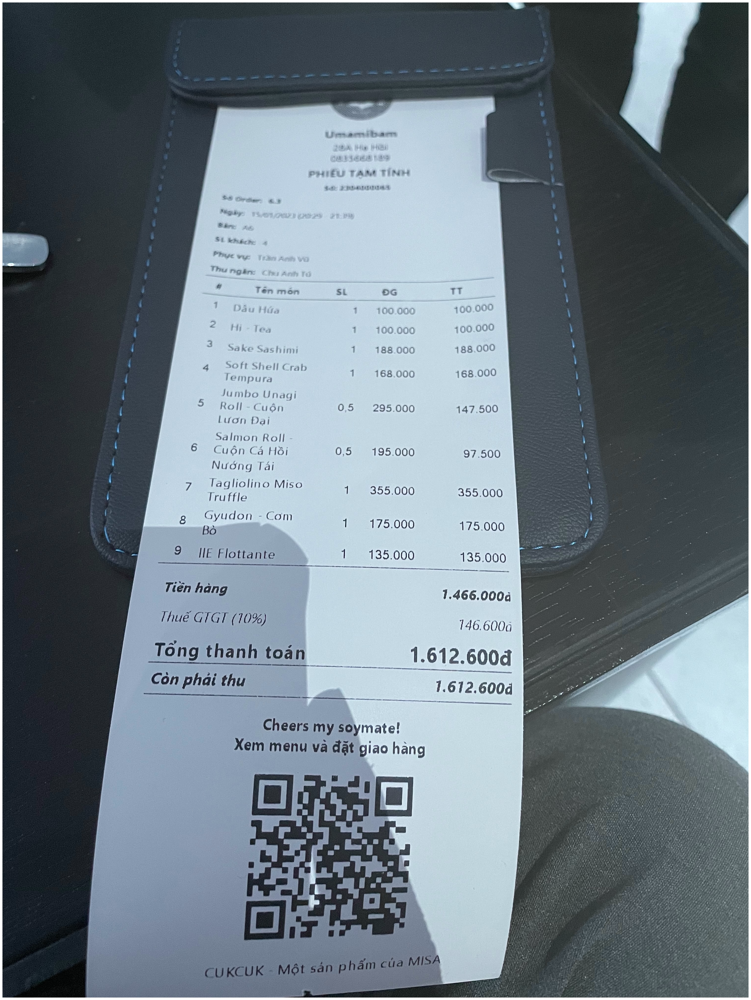

In [7]:
# Create Boxes
boxes = []
for line in result:
  line = line[0]
  boxes.append([[int(line[0][0]), int(line[0][1])], [int(line[2][0]), int(line[2][1])]])

boxes = boxes[::-1]

EXPEND = 5
for box in boxes:
  box[0][0] = box[0][0] - EXPEND
  box[0][1] = box[0][1] - EXPEND
  box[1][0] = box[1][0] + EXPEND
  box[1][1] = box[1][1] + EXPEND


texts = []
for box in boxes:
  cropped_image = img[box[0][1]:box[1][1], box[0][0]:box[1][0]]

  try:
    cropped_image = Image.fromarray(cropped_image)
  except:
    continue

  #rec_result = Paddle.ocr(cropped_image, cls=True, det=False, rec=True)
  rec_result = detector.predict(cropped_image)

  text = rec_result#[0]

  texts.append(text)
  print(text)

display_image_in_actual_size(img, 100)